# Flow API README

The Flow module is designed to provide key plots and metrics that are commonly used when reviewing the preformance or debugging a Cpass SmartFlow.

In [41]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append("..")

import os
from google.cloud import bigquery
from src import Flow



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [42]:
FlowName = "United Kingdom - Customer Service"
flow = Flow(flow_name=FlowName, # The name of the smart flow to be analised
            start_date=None, # The oldest data point permitted 
            end_date=None, # The newest data point ṕermitted
            include_tollfree=True # If numbers starting with 800, 888, 877, 866, 855, 844 or 833 should be included or not
           )

Creating distinct_sessionId_count_plot
Master Dataset Gathered in 1.0 seconds


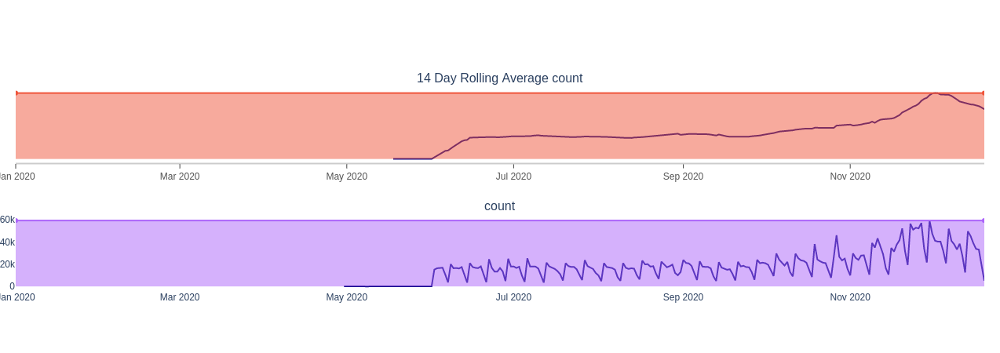

In [43]:
flow.distinct_sessionId_count_plot().show()

# distinct_sessionId_count_plot

This method returns both the raw count of unique sessionIds per day and a 14 day rolling average of the same metric. This data will always be generated from the "master_data" as such changing flow instance values like "start_date" or "include_tollfree" will not effect the metric. 

Generally, (or at least in the dash app) this view is used to indicate to the user what section of data they are looking at. Because of this the background colors will move/change to refleect "start_date" and "end_dates" of the flow instance. The area shaded with color is what is being used in calculation of other plots in this class. 

# Modifing Flow Instance Properties

To see only a slice of the historical data in analysis plots modifiy the flow start_date and end_date properties. This will also be reflected in the distinct_sessionId_count_plot

Creating top_paths_plot


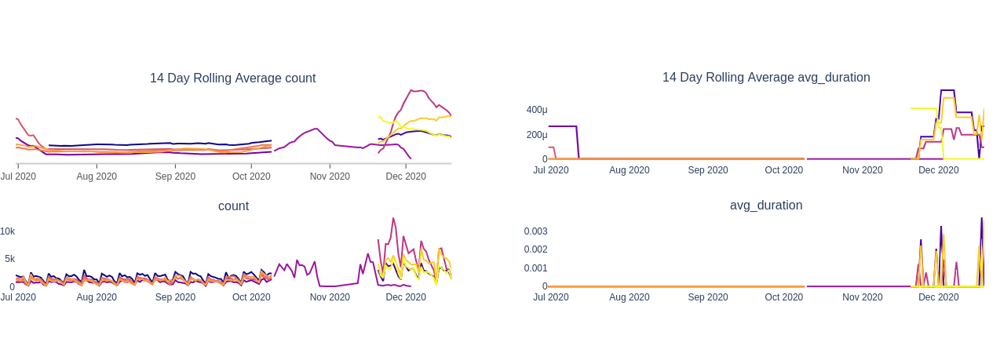

In [44]:
flow.top_paths_plot().show()


# Top Paths Plot

When the flow instance is first created a large dataset is grabbed from BigQuery. Inside this dataset all of the defferent path option a user took are caluclated, counted, and given a name associated with there relative frequency inside the master_data. The top_paths_plot api displays the 10 most common paths for a given time range (range is set by flow instance start_date and end_date). 

Because paths do not change names after the initial data grab it is common that names of the 10 most popular paths in a date range are numbers outside of 0-10.

Starting genSankey of plot 2020-04-30 19:06:51+00:00 to 2020-12-19 22:57:53+00:00
labelList created in 51.11
sourceTargetDf created in 55.46
sourceID created in 0.87
targetID created in 0.99
plotting parameters 0   1-Path_Freq_Rank
Finished in 127.9


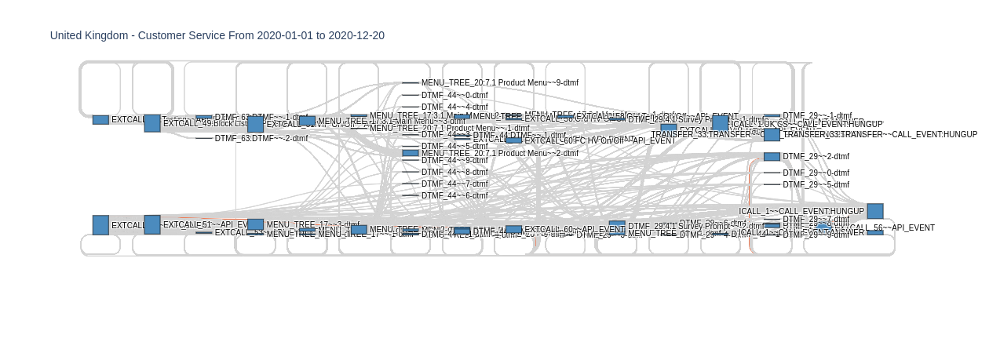

In [46]:
flow.sankey_plot()

# Sankey Plot

The sankey_plot api generates a sankey flow plot of the user paths based on events seen in the ADRs. Parameters for this plot are taken directly from the flow instance parameters (example start_date, end_date). By default the orange line indicates the path labeled '1-Path_Freq_Rank' (which is the most frequency user path in the master data set)

plotting parameters 0   2-Path_Freq_Rank


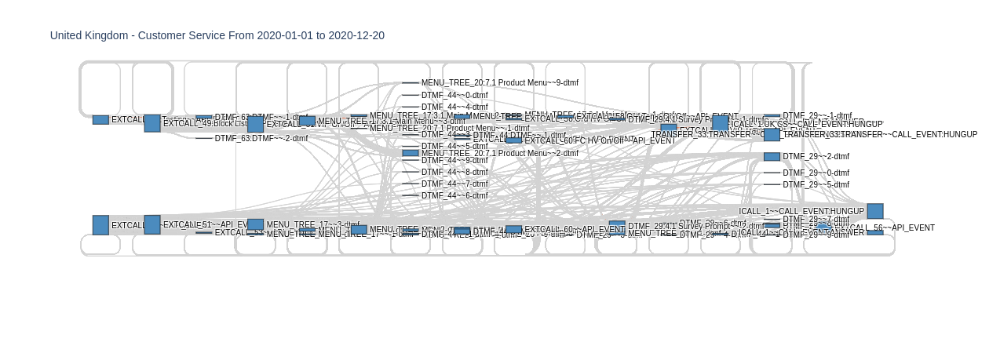

In [47]:
flow.sankey_modify_path_highlight('2-Path_Freq_Rank').show()

# Modify Path Highlight

The sankey_modify_path_highlight method changes the orange highlighted path

plotting parameters 2200   2-Path_Freq_Rank


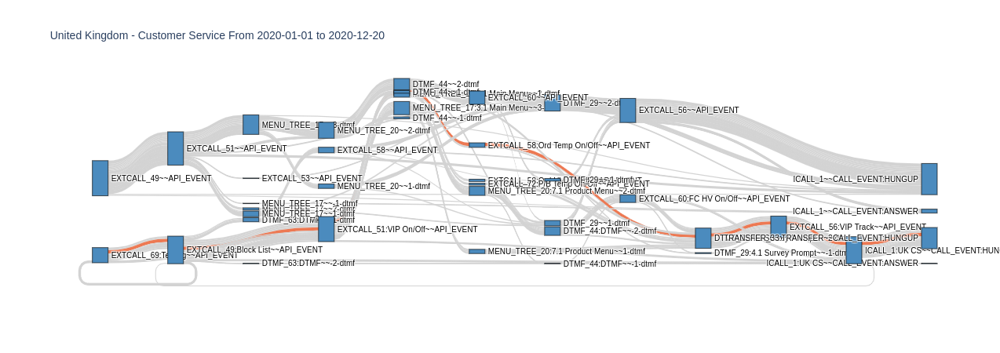

In [50]:
flow.sankey_modify_threshold(2200)

# Modifying the Threshold

The sankey_modify_threshold api reduces noise in the Sankey plot by removing nodes that have less users than the value set in this parameter. 